In [1]:
! nvidia-smi

Mon Sep 18 13:53:41 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Download Libraries

In [2]:
%pip install timm shap grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 48.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 76.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 35.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.9 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38243 sha256=eadb53002005509a15dff9eaf8597ebd74368e16e1d11abfe94ce7af25840d82
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


In [3]:
%pip install git+https://github.com/pytorch/captum.git

  Cloning https://github.com/pytorch/captum.git to /tmp/pip-req-build-8j3ph_ug
  Running command git clone --filter=blob:none --quiet https://github.com/pytorch/captum.git /tmp/pip-req-build-8j3ph_ug
  Resolved https://github.com/pytorch/captum.git to commit 945c582cc0b08885c4e2bfecb020abdfac0122f3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for captum: filename=captum-0.6.0-py3-none-any.whl size=588985 sha256=b00bc0f8292bfb1fc42c5858ae42855f7c45cea3c5449e54f37e924074ec102b
  Stored in directory: /tmp/pip-ephem-wheel-cache-qf8za_cd/wheels/8e/b7/c3/e17a61e561b99ab720ae04e56543dcd69884dee09a09bf5ae4
Successfully built captum


In [4]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

from matplotlib.colors import LinearSegmentedColormap

import matplotlib.pyplot as plt

In [5]:
device = torch.device("cuda:0")

In [6]:
model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

In [7]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]


In [8]:
# list(enumerate(categories))

# Get 10 different Imagenet class images

In [9]:
! wget -O cat.jpeg "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSKr5wT7rfkjkGvNeqgXjBmarC5ZNoZs-H2uMpML8O7Q4F9W-IlUQibBT6IPqyvX45NOgw&usqp=CAU"
! wget -O banana.jpeg "https://forums.fast.ai/uploads/default/original/2X/f/fe7a953470bfedfde144a40d0885636d1298eed6.jpg"
! wget -O pizza.jpeg "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRedRHYXaUahzoiqIrH_ESmkMj5KioholtL_w&usqp=CAU"
! wget -O tank.jpeg "https://www.nationaldefensemagazine.org/-/media/sites/magazine/2023/09/2022abrams-m1a2-1.jpg"
! wget -O leopard.jpeg "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR_NTnqvGKOPuEYFky9XJxsgvKNSdEHlgv9UT_Qbb1ZHPK7JRH7wjJpr6kJpNBiJ5MpqxQ&usqp=CAU"
! wget -O bucket.jpeg "https://media.istockphoto.com/id/918369258/photo/plastic-bucket.jpg?s=612x612&w=0&k=20&c=-qc6hvmgUL6Dgrlzhw5Qx9dLnxiazNQc1Vykk7kWPUQ="
! wget -O envelope.jpeg "https://media.istockphoto.com/id/625371104/photo/bright-blue-envelope.jpg?s=612x612&w=0&k=20&c=UBUnKJVKHfTfRdF6126FEjGklyUGZws2e2oSzDQKIm0="
! wget -O restaurant.jpeg "https://leonhardfs.github.io/TripAdvisorProject/images/inside.jpg"
! wget -O sunglass.jpeg "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSh_9PaLMuustjBvykugKNajg3MD8DH8x-Flw&usqp=CAU"
! wget -O volcano.jpeg "https://media.istockphoto.com/id/177363117/photo/tungurahua-volcano-eruption-long-exposure-with-lava.jpg?s=612x612&w=0&k=20&c=LpJ8OVK4jB_MYJNkS5sCh_w5_7tKzTgjDZNy8OcnsQs="

--2023-09-18 13:54:41--  https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSKr5wT7rfkjkGvNeqgXjBmarC5ZNoZs-H2uMpML8O7Q4F9W-IlUQibBT6IPqyvX45NOgw&usqp=CAU
Resolving encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)... 142.251.12.100, 142.251.12.101, 142.251.12.139, ...
Connecting to encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)|142.251.12.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6107 (6.0K) [image/jpeg]
Saving to: ‘cat.jpeg’

cat.jpeg            100%[===================>]   5.96K  --.-KB/s    in 0s      

2023-09-18 13:54:42 (57.1 MB/s) - ‘cat.jpeg’ saved [6107/6107]

--2023-09-18 13:54:42--  https://forums.fast.ai/uploads/default/original/2X/f/fe7a953470bfedfde144a40d0885636d1298eed6.jpg
Resolving forums.fast.ai (forums.fast.ai)... 107.170.249.202
Connecting to forums.fast.ai (forums.fast.ai)|107.170.249.202|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 219523 (214K) [image/jpeg]
Saving to: ‘banana.jpe

# Model Interpretation

In [10]:
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

In [11]:
images = ['banana.jpeg', 'bucket.jpeg', 'cat.jpeg', 'envelope.jpeg', 'leopard.jpeg', 'pizza.jpeg', 'restaurant.jpeg', 'sunglass.jpeg',
          'tank.jpeg', 'volcano.jpeg']

transformed_img_list=[]
img_tensor_list=[]
for image in images:
  img = Image.open(image)
  transformed_img = transform(img)
  img_tensor = transform_normalize(transformed_img)
  img_tensor = img_tensor.unsqueeze(0)
  img_tensor = img_tensor.to(device)
  img_tensor_list.append(img_tensor)
  transformed_img_list.append(transformed_img)

In [ ]:
# img_tensor_list[0]

## IG

In [15]:
from captum.attr import IntegratedGradients
from captum.attr import visualization as viz

integrated_gradients = IntegratedGradients(model)

In [16]:
default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                 [(0, '#ffffff'),
                                                  (1, '#000000')], N=256)

Predicted: banana ( 0.9999898672103882 )


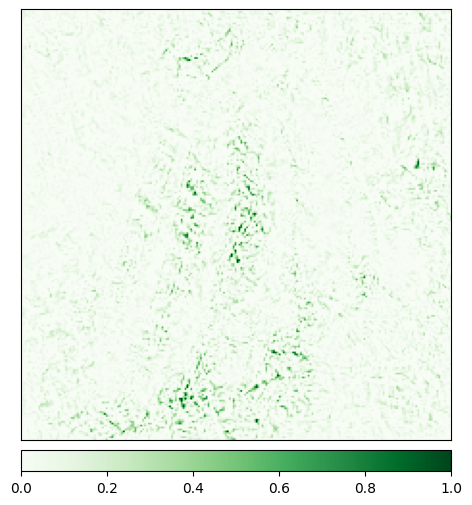

Predicted: bucket ( 0.979712724685669 )


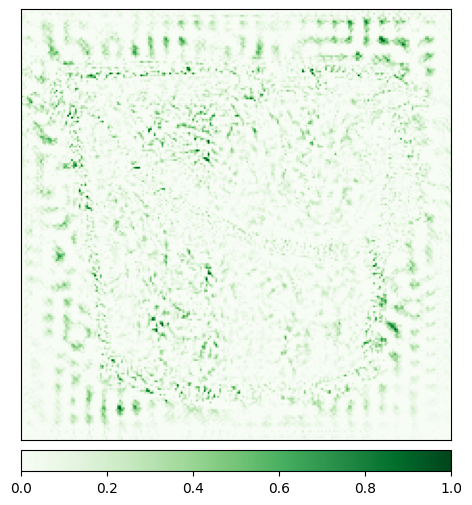

Predicted: Egyptian cat ( 0.5664435625076294 )


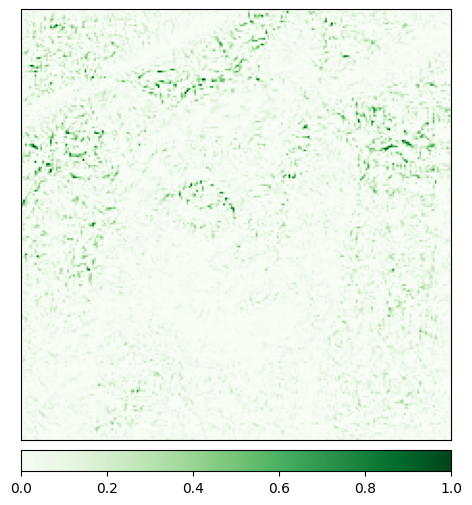

Predicted: binder ( 0.4190036952495575 )


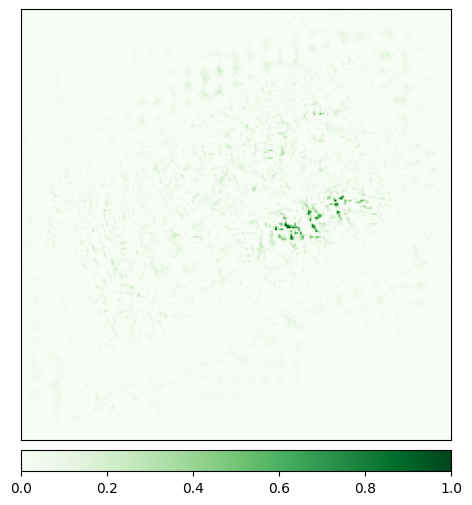

Predicted: leopard ( 0.9887319803237915 )


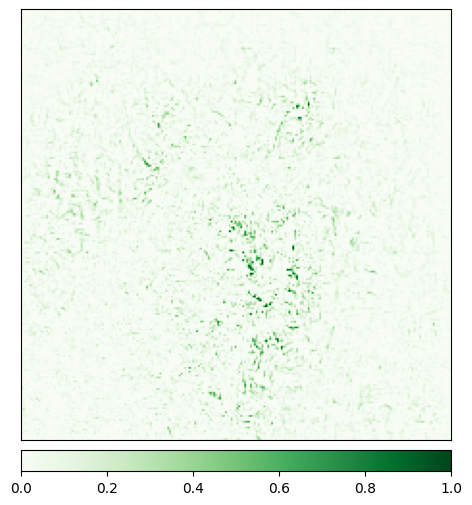

Predicted: pizza ( 0.9984897375106812 )


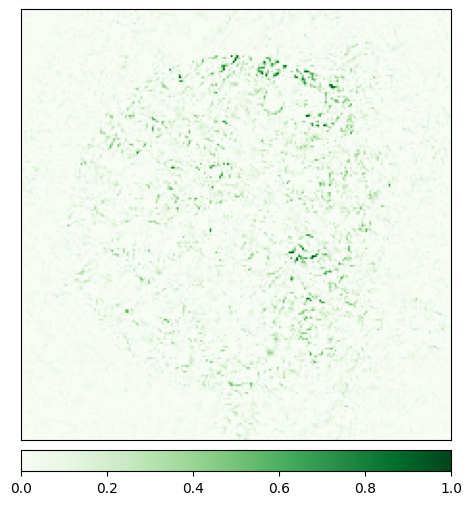

Predicted: restaurant ( 0.9626610279083252 )


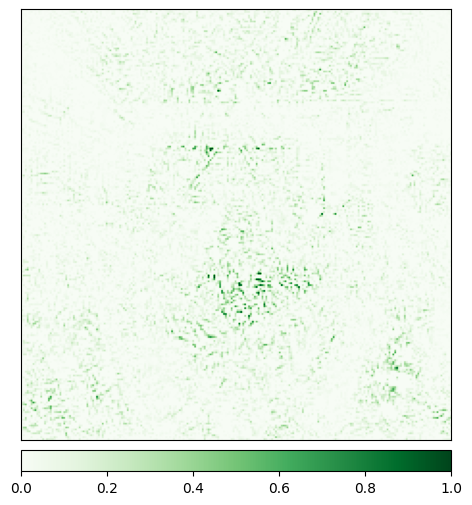

Predicted: sunglass ( 0.7621163725852966 )


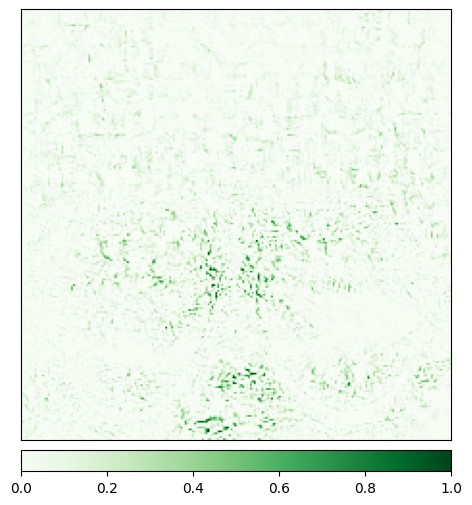

Predicted: tank ( 0.9999402761459351 )


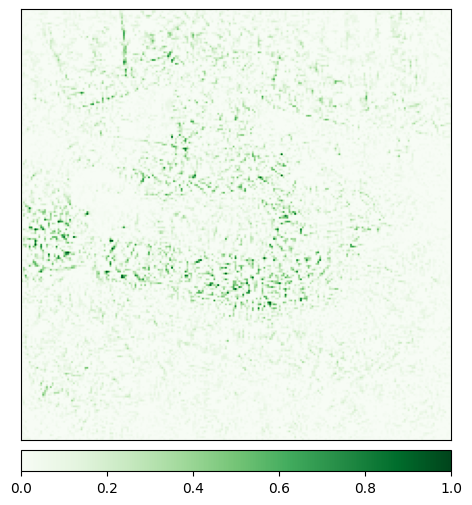

Predicted: volcano ( 1.0 )


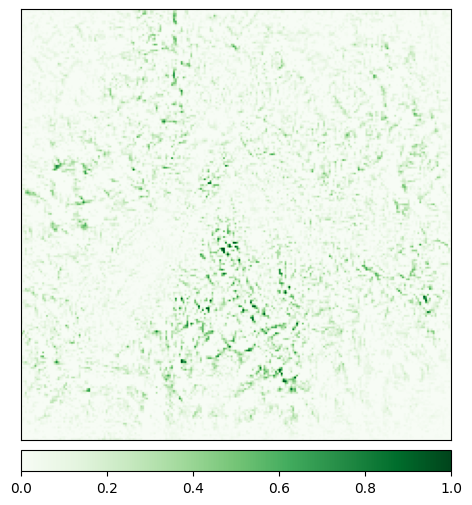

In [17]:
for i in range(10):
  img_tensor = img_tensor_list[i]
  transformed_img = transformed_img_list[i]

  with torch.no_grad():
    output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]
  print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

  attributions_ig = integrated_gradients.attribute(img_tensor, target=285, n_steps=400)

  _ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1, 2, 0)),
                             np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1, 2, 0)),
                             method='heat_map',
                            #  cmap=default_cmap,
                             show_colorbar=True,
                             sign='positive',
                             outlier_perc=1)

## IG w/ Noise Tunnel

In [18]:
from captum.attr import NoiseTunnel

Predicted: banana ( 0.9999898672103882 )


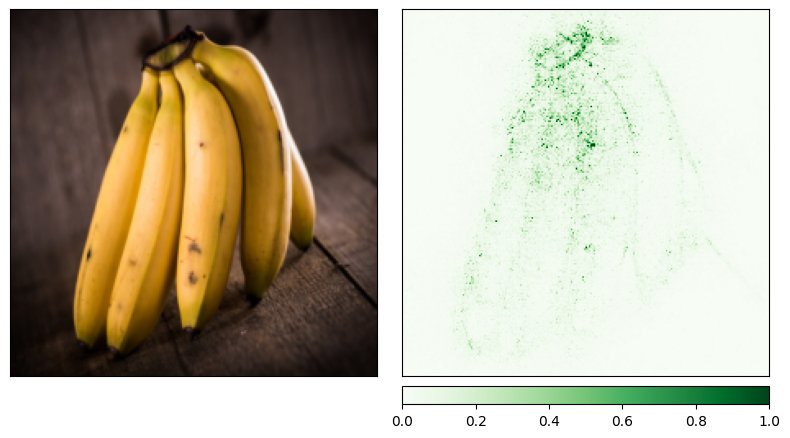

Predicted: bucket ( 0.979712724685669 )


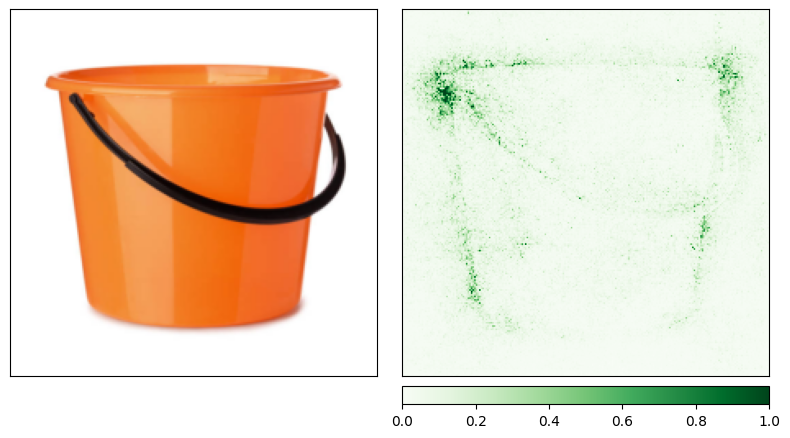

Predicted: Egyptian cat ( 0.5664435625076294 )


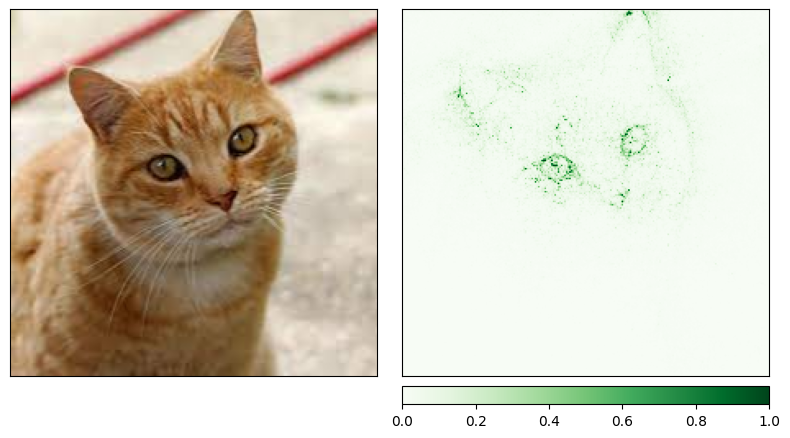

Predicted: binder ( 0.4190036952495575 )


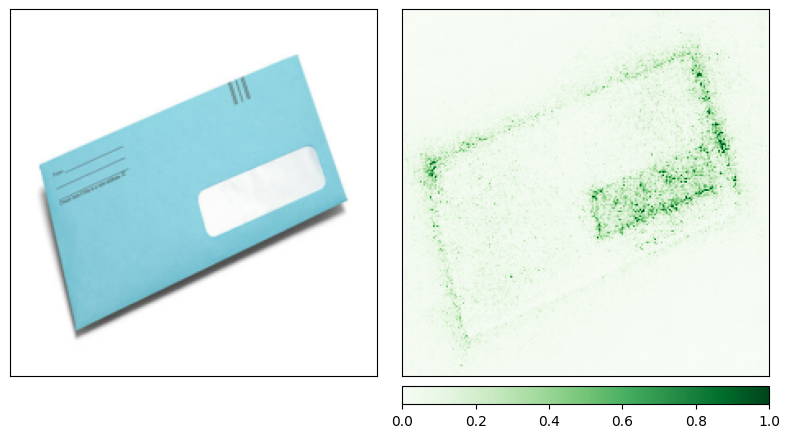

Predicted: leopard ( 0.9887319803237915 )


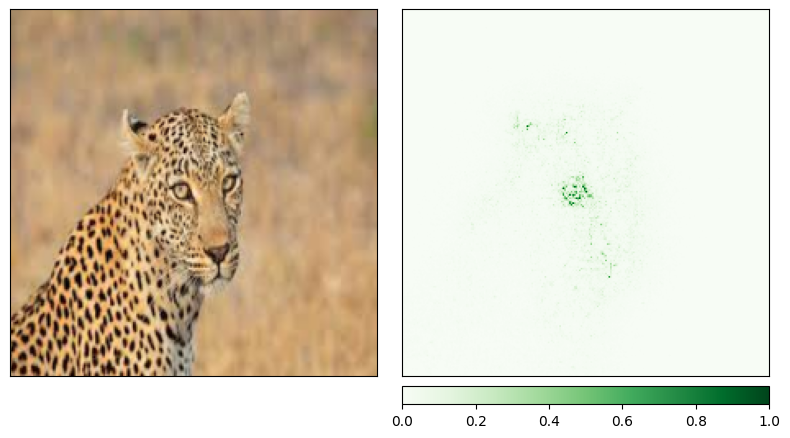

Predicted: pizza ( 0.9984897375106812 )


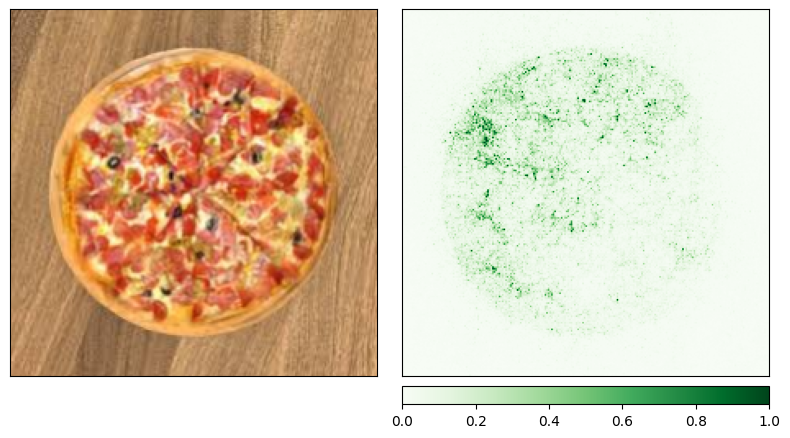

Predicted: restaurant ( 0.9626610279083252 )


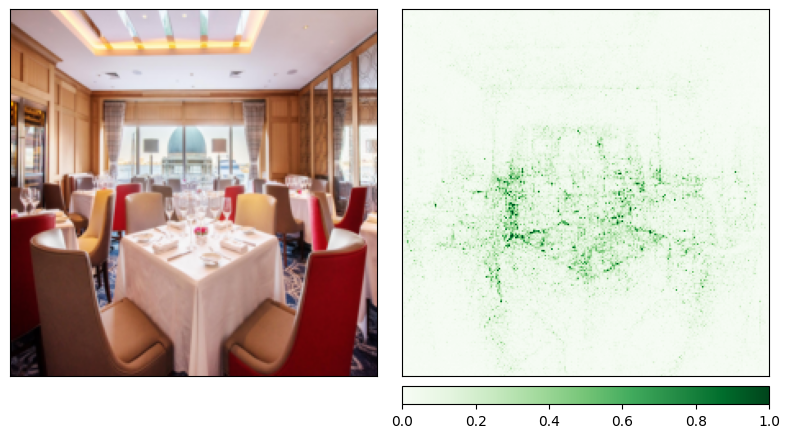

Predicted: sunglass ( 0.7621163725852966 )


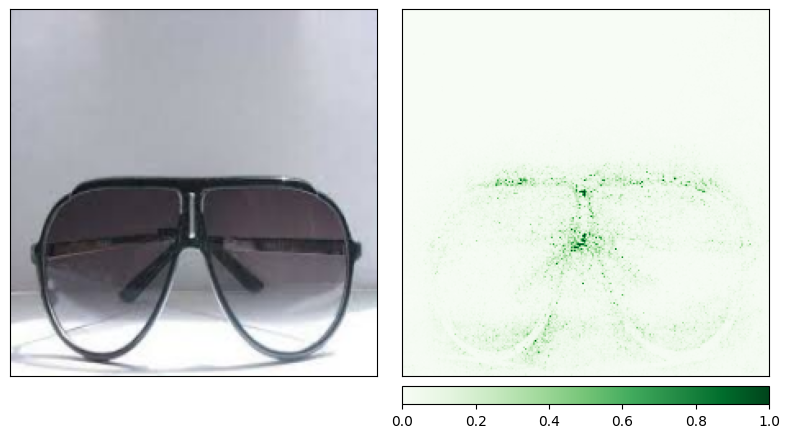

Predicted: tank ( 0.9999402761459351 )


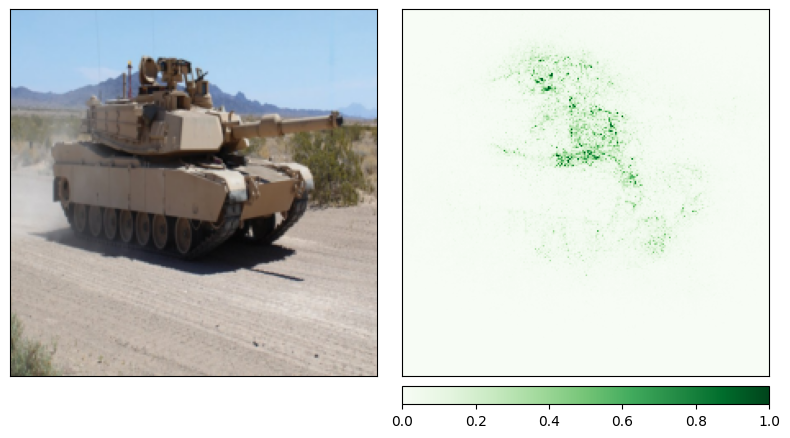

Predicted: volcano ( 1.0 )


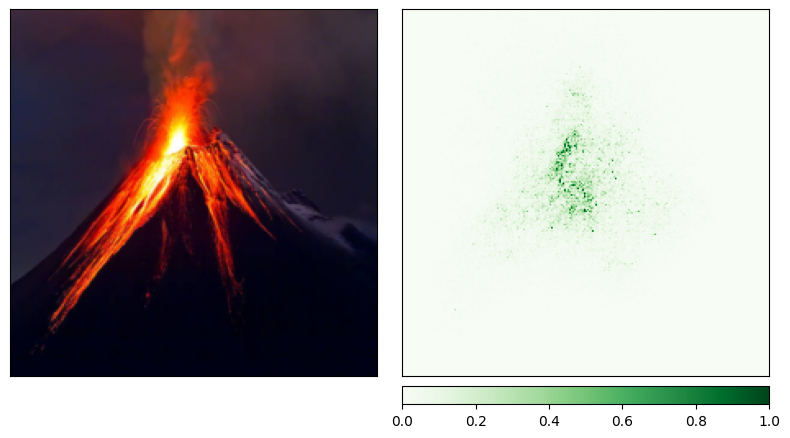

In [19]:
for i in range(10):
  img_tensor = img_tensor_list[i]
  transformed_img = transformed_img_list[i]

  with torch.no_grad():
    output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]
  print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

  noise_tunnel = NoiseTunnel(integrated_gradients)

  attributions_ig_nt = noise_tunnel.attribute(img_tensor, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
  _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1, 2, 0)),
                                        np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1, 2, 0)),
                                        ["original_image", "heat_map"],
                                        ["all", "positive"],
                                      #   cmap=default_cmap,
                                        show_colorbar=True)

## Occlusion

In [22]:
from captum.attr import Occlusion

Predicted: banana ( 0.9999898672103882 )


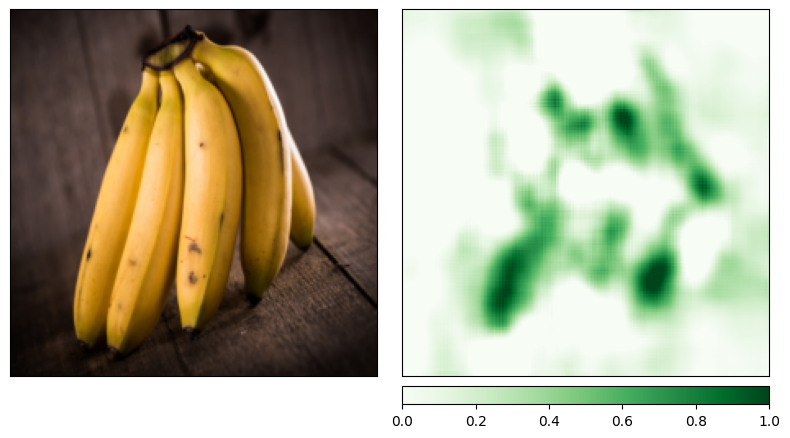

Predicted: bucket ( 0.979712724685669 )


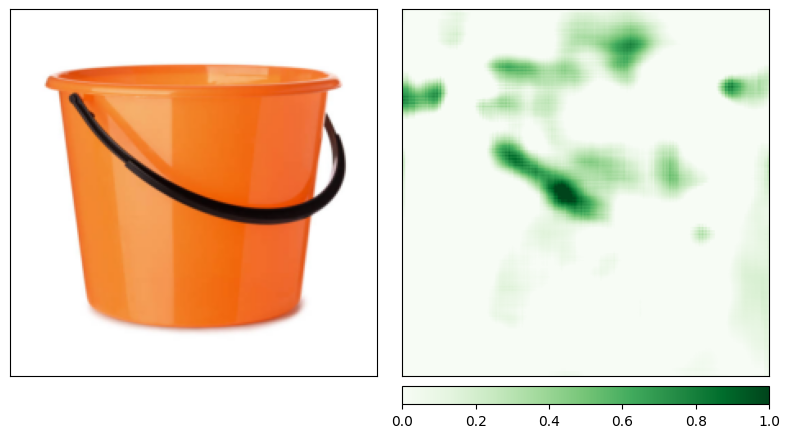

Predicted: Egyptian cat ( 0.5664435625076294 )


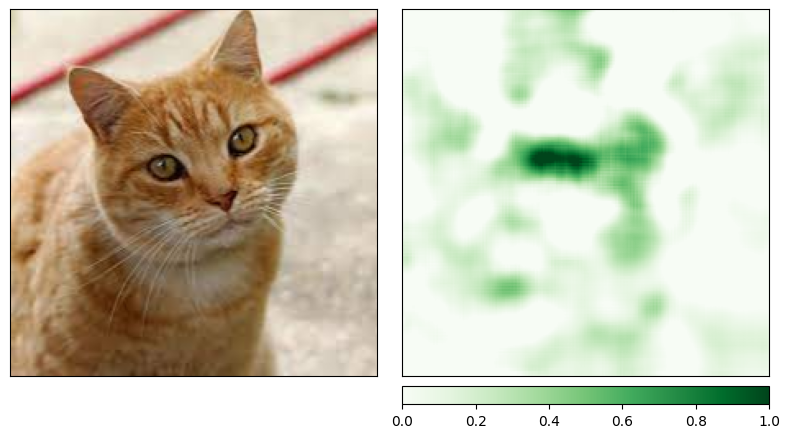

Predicted: binder ( 0.4190036952495575 )


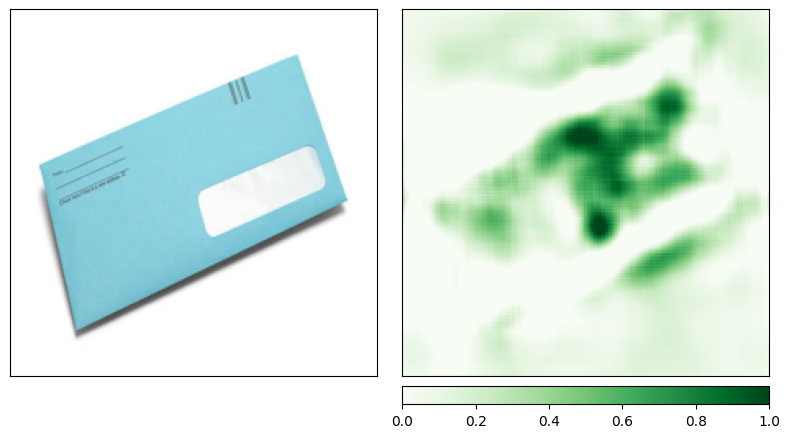

Predicted: leopard ( 0.9887319803237915 )


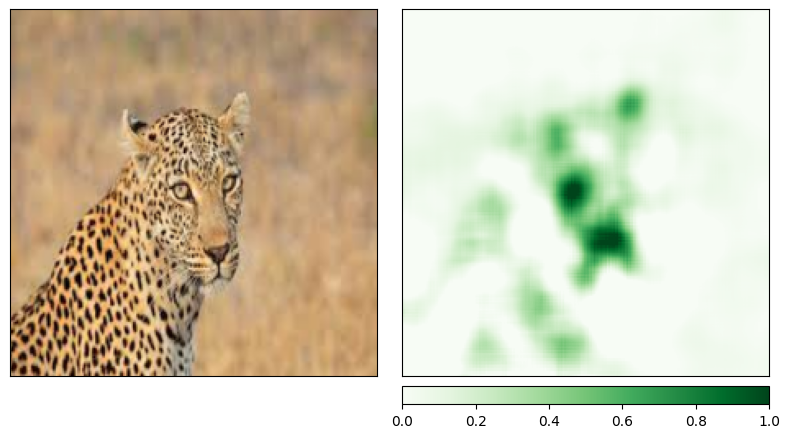

Predicted: pizza ( 0.9984897375106812 )


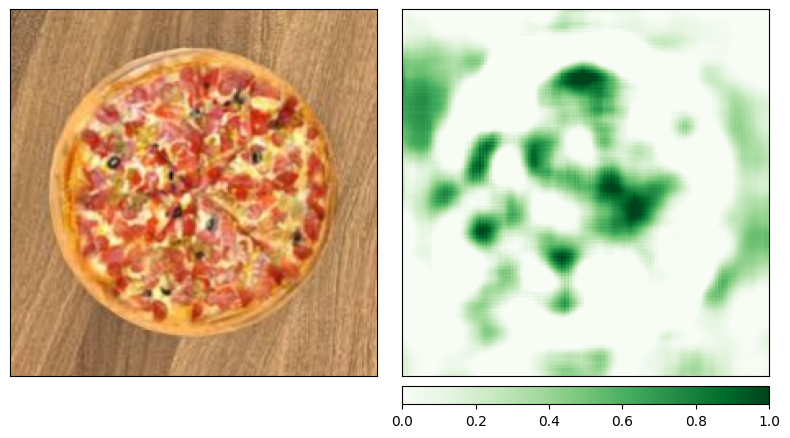

Predicted: restaurant ( 0.9626610279083252 )


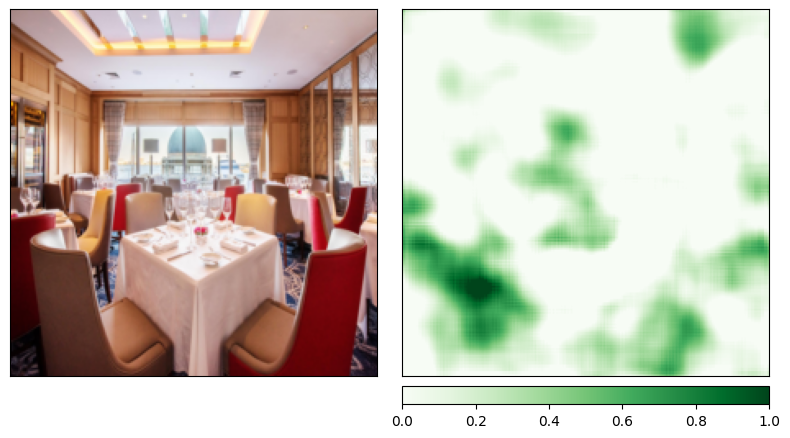

Predicted: sunglass ( 0.7621163725852966 )


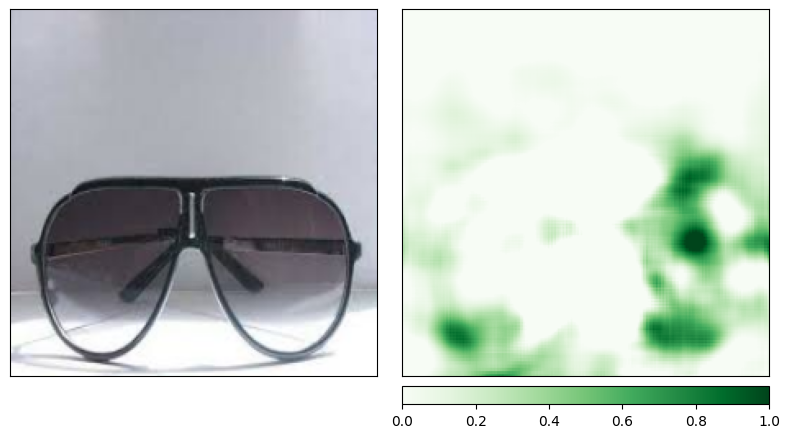

Predicted: tank ( 0.9999402761459351 )


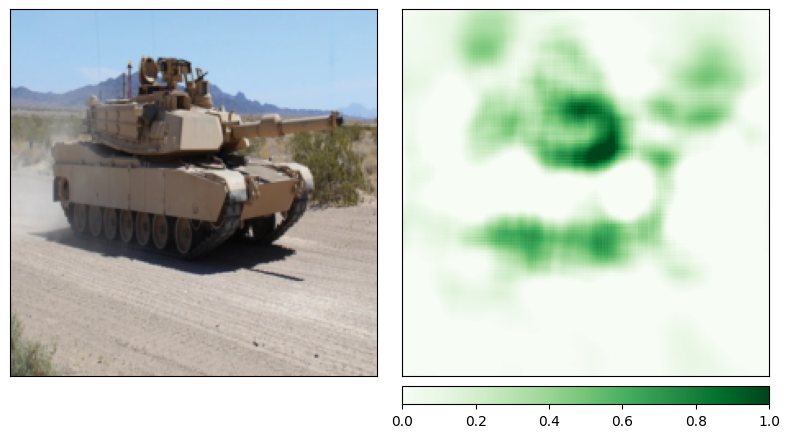

Predicted: volcano ( 1.0 )


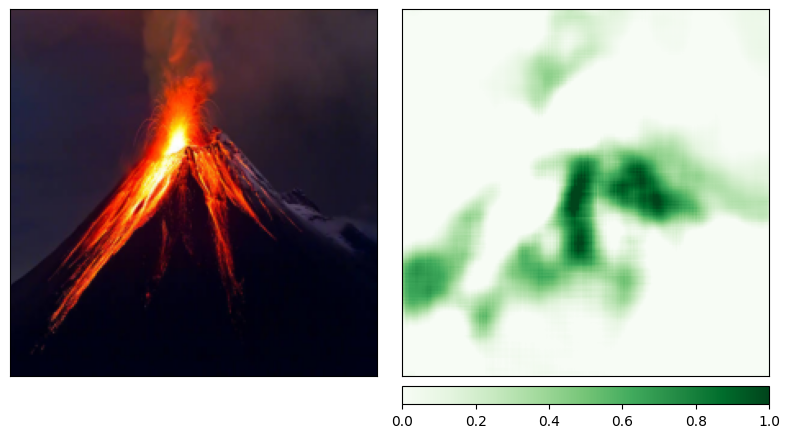

In [23]:
for i in range(10):
  img_tensor = img_tensor_list[i]
  transformed_img = transformed_img_list[i]

  with torch.no_grad():
    output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]
  print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

  occlusion = Occlusion(model)

  attributions_occ = occlusion.attribute(img_tensor,
                                        strides = (3, 2, 2),
                                        target=pred_label_idx,
                                        sliding_window_shapes=(3, 15, 15),
                                        baselines=0)

  _ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        ["original_image", "heat_map"],
                                        ["all", "positive"],
                                        show_colorbar=True,
                                        outlier_perc=2,
                                      )

## SHAP

Works well where number of classes are less

In [24]:
import shap

In [25]:
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

img_tensor_list2=[]
for image in images:
  img = Image.open(image)
  img_tensor = transform(img)
  img_tensor = img_tensor.unsqueeze(0)
  img_tensor = img_tensor.to(device)
  img_tensor_list2.append(img_tensor)

In [26]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]
inv_transform= T.Compose([
    T.Lambda(lambda x: x.permute(0, 3, 1, 2)),
    T.Normalize(
        mean = (-1 * np.array(mean) / np.array(std)).tolist(),
        std = (1 / np.array(std)).tolist()
    ),
    T.Lambda(lambda x: x.permute(0, 2, 3, 1)),
])

In [27]:
def predict(imgs: torch.Tensor) -> torch.Tensor:
    imgs = torch.tensor(imgs)
    imgs = imgs.permute(0, 3, 1, 2)

    img_tensor = imgs.to(device)

    output = model(img_tensor)
    return output

In [28]:
topk = 10
batch_size = 50
n_evals = 10000

# define a masker that is used to mask out partitions of the input image.
masker_blur = shap.maskers.Image("blur(128,128)", (224, 224, 3))

# create an explainer with model and image masker
explainer = shap.Explainer(predict, masker_blur, output_names=categories)

In [29]:
for i in range(10):
  img_tensor = img_tensor_list2[i]

  model_out = model(img_tensor)
  classes = torch.argmax(model_out, axis=1).cpu().numpy()
  print(f'Classes: {classes}: {np.array(categories)[classes]}')

Classes: [954]: ['banana']
Classes: [463]: ['bucket']
Classes: [285]: ['Egyptian cat']
Classes: [446]: ['binder']
Classes: [288]: ['leopard']
Classes: [963]: ['pizza']
Classes: [762]: ['restaurant']
Classes: [836]: ['sunglass']
Classes: [847]: ['tank']
Classes: [980]: ['volcano']


  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:43, 43.67s/it]               


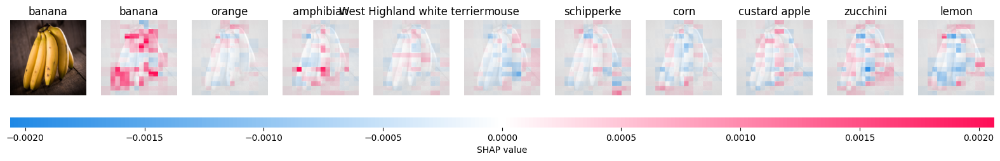

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:38, 38.86s/it]               


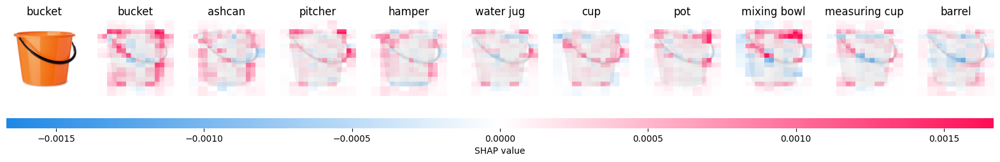

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:39, 39.36s/it]               


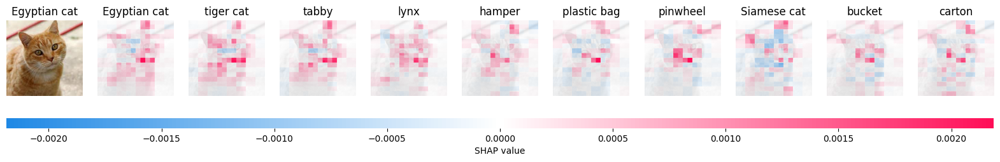

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:40, 40.83s/it]               


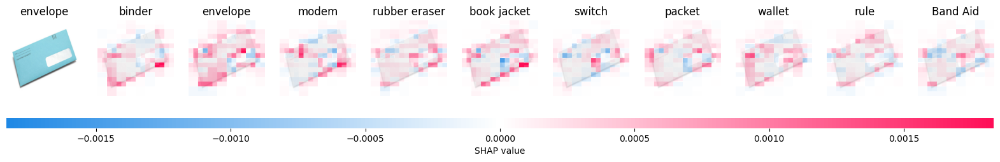

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:40, 40.89s/it]               


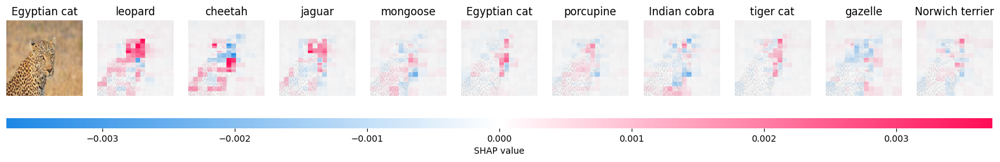

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:41, 41.65s/it]               


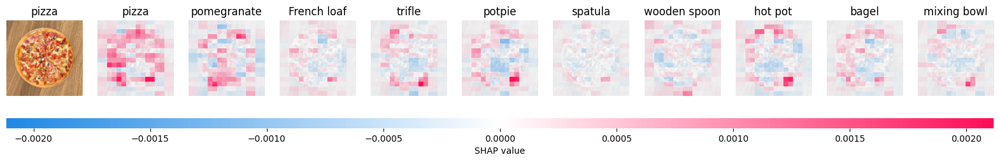

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:43, 43.16s/it]               


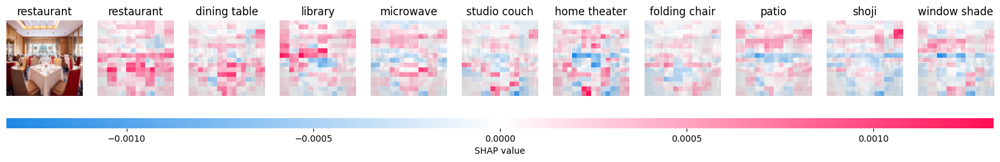

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:42, 42.07s/it]               


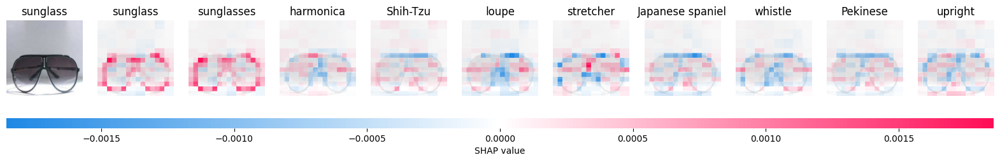

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:42, 42.06s/it]               


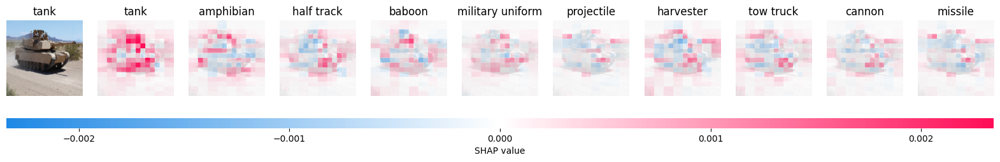

  0%|          | 0/9998 [00:00<?, ?it/s]

Partition explainer: 2it [00:42, 42.27s/it]               


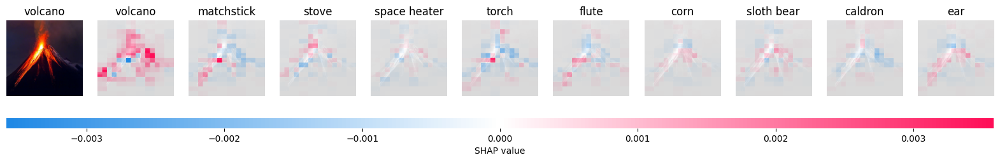

In [30]:
act_classes = [954,463,285,549,285,963,762,836,847,980]

for i in range(10):
  # feed only one image
  # here we explain two images using 100 evaluations of the underlying model to estimate the SHAP values
  image_np = Image.open(images[i])
  img_tensor = transform(image_np)
  img_tensor = img_tensor.unsqueeze(0)
  img_tensor = img_tensor.permute(0, 2, 3, 1)

  shap_values = explainer(img_tensor, max_evals=n_evals, batch_size=batch_size,
                          outputs=shap.Explanation.argsort.flip[:topk])

  shap_values.data = inv_transform(shap_values.data).cpu().numpy()[0]
  shap_values.values = [val for val in np.moveaxis(shap_values.values[0], -1, 0)]

  shap.image_plot(shap_values=shap_values.values,
                  pixel_values=shap_values.data,
                  labels=shap_values.output_names,
                  true_labels=[categories[act_classes[i]]])

## GradCAM

In [31]:
import timm
import torch
import torchvision.transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [32]:
device = torch.device("cpu")

In [33]:
model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

In [34]:
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

img_tensor_list3=[]
for image in images:
  img = Image.open(image)
  img_tensor = transform(img)
  img_tensor = img_tensor.unsqueeze(0)
  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)
  img_tensor_list3.append(img_tensor)

In [35]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]
inv_transform = T.Compose([
    # T.Lambda(lambda x: x.permute(0, 2, 3, 1)),
    T.Normalize(
        mean = (-1 * np.array(mean) / np.array(std)).tolist(),
        std = (1 / np.array(std)).tolist()
    ),
    # T.Lambda(lambda x: x.permute(0, 3, 1, 2)),
])

In [36]:
target_layers = [model.layer4[-1]]

cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

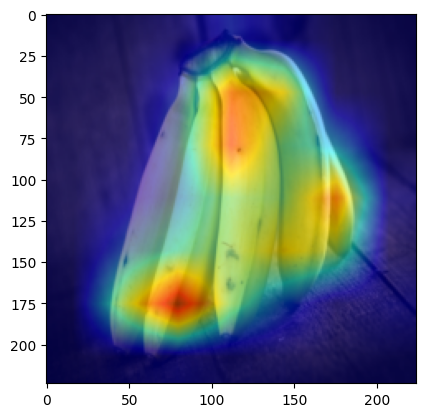

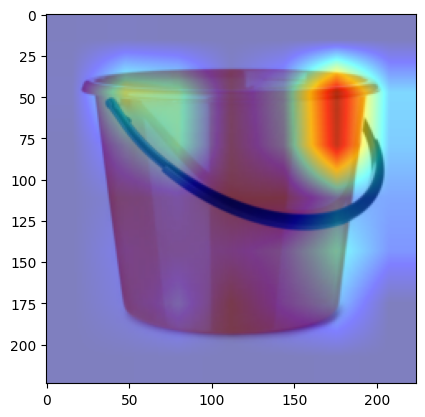

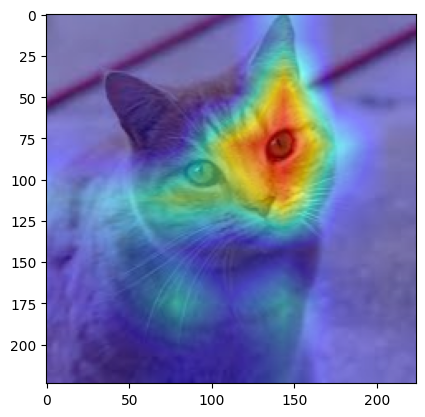

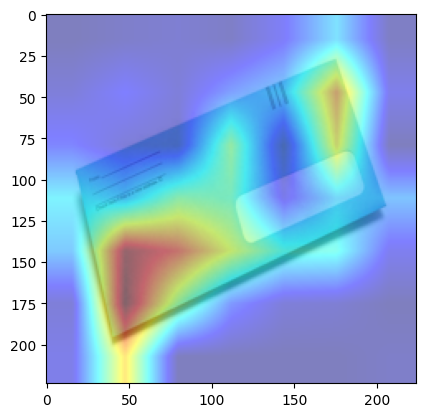

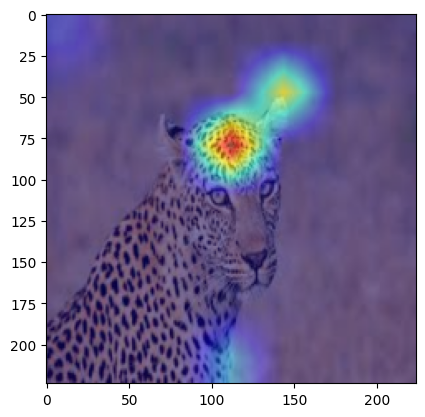

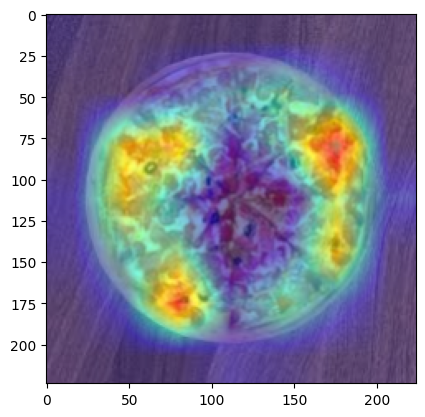

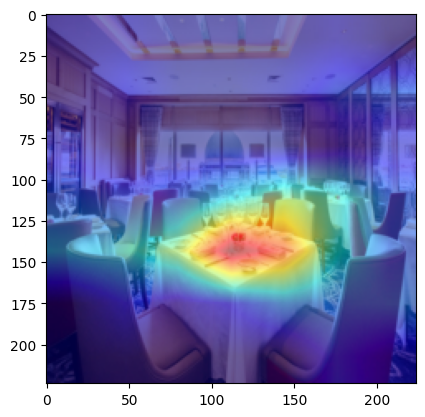

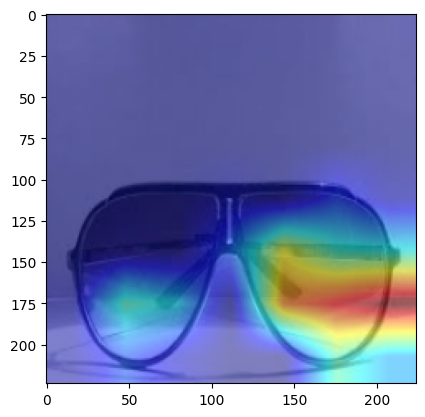

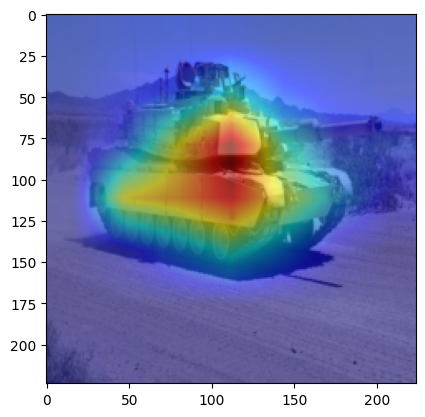

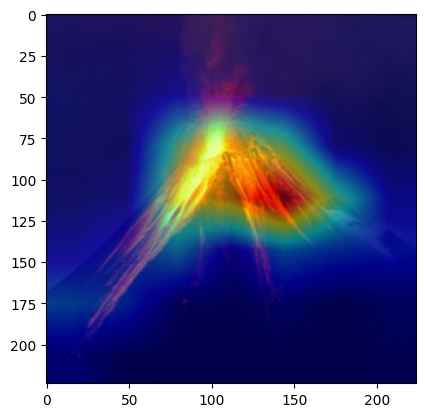

In [37]:
for i in range(10):
  img_tensor = img_tensor_list3[i]
  targets = [ClassifierOutputTarget(act_classes[i])]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=img_tensor, targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  plt.imshow(visualization)
  plt.show()

## GradCAM++

In [38]:
from pytorch_grad_cam import GradCAMPlusPlus

In [39]:
cam = GradCAMPlusPlus(model=model, target_layers=target_layers, use_cuda=True)

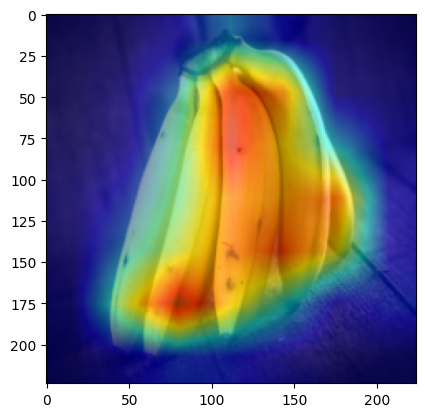

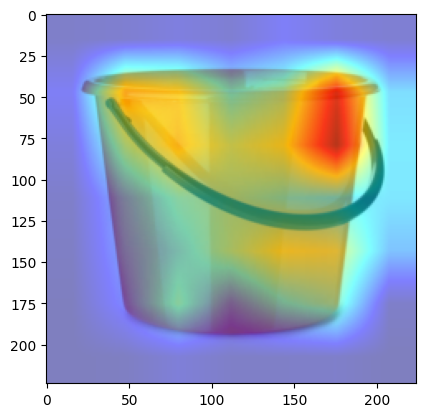

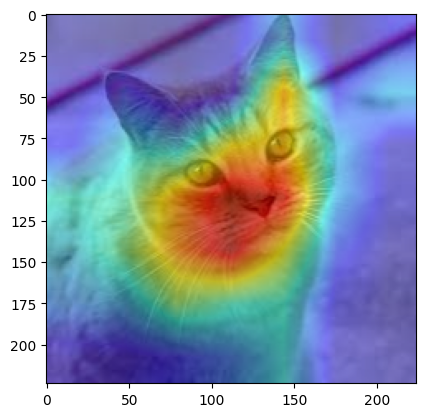

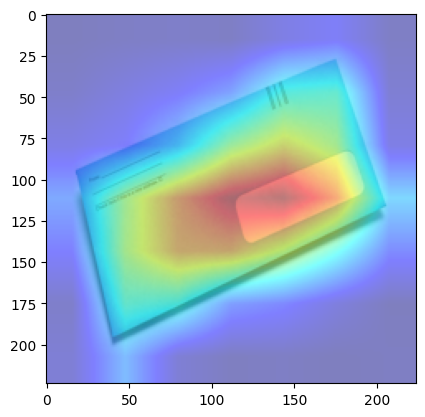

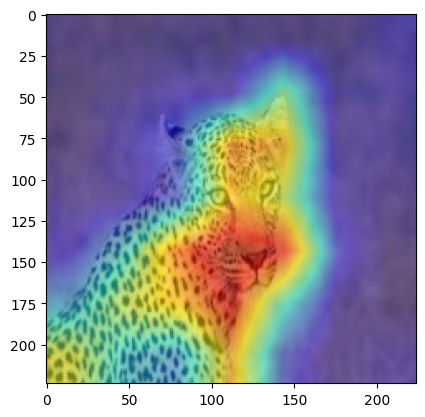

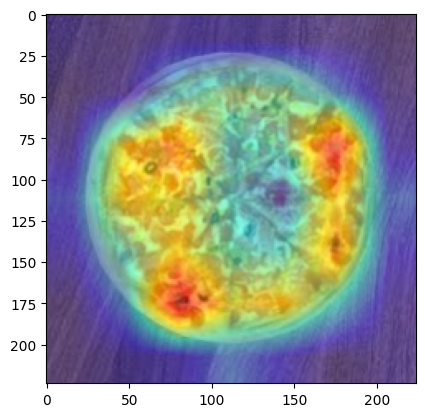

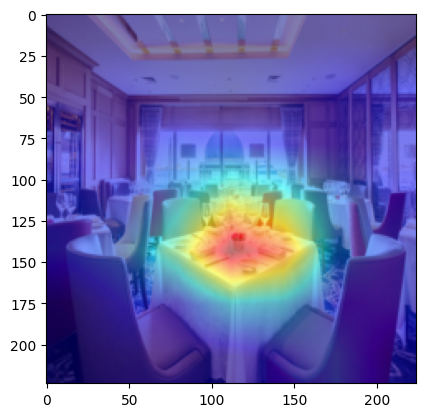

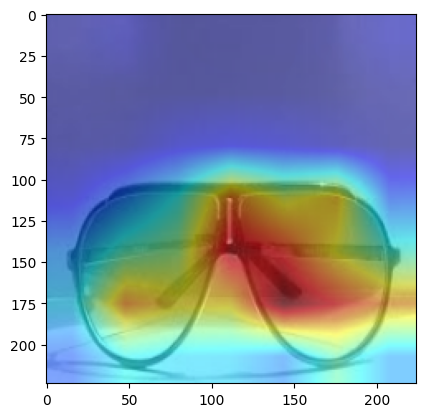

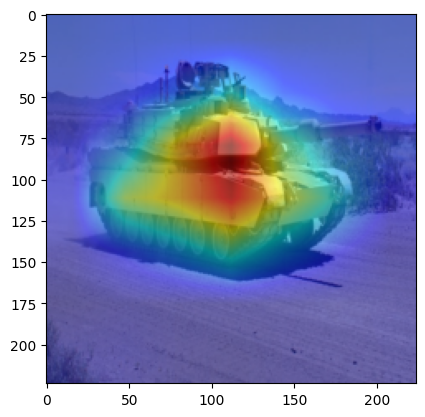

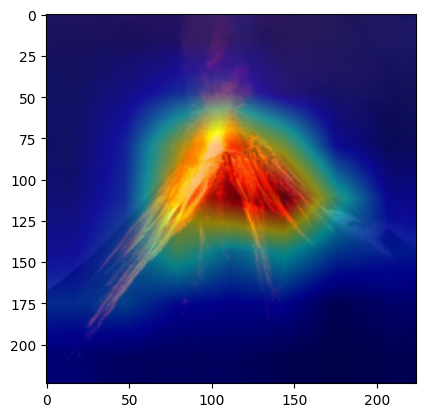

In [40]:
for i in range(10):
  img_tensor = img_tensor_list3[i]
  targets = [ClassifierOutputTarget(act_classes[i])]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=img_tensor, targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  plt.imshow(visualization)
  plt.show()